In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing, model_selection, metrics

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [1]:
asif_graph_color_theme = "#ff9900"
asif_colors = ["#ff9900", "#00a3cc", "#004d99"]

In [3]:
#import the dataset in dataframe
data = pd.read_csv("../datasets/01_KAG_energydata_complete/KAG_energydata_complete.csv")

In [4]:
data.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [5]:
type(data)

pandas.core.frame.DataFrame

In [6]:
tmp1 = pd.Series(
    np.array((1,3,5,7,9))
)

In [7]:
type(tmp1)

pandas.core.series.Series

In [8]:
type(tmp1[0])

numpy.int64

In [9]:
tmp = pd.DataFrame(data={"column": tmp1})

In [10]:
type(tmp)

pandas.core.frame.DataFrame

In [11]:
print (tmp.values)

[[1]
 [3]
 [5]
 [7]
 [9]]


In [12]:
tmp

,column
0,1
1,3
2,5
3,7
4,9


In [13]:
del tmp, tmp1

##### ------- printing shape of data, i.e., tuple

In [14]:
print(
    "The shape of dataset (in the form of a tuple) is - {:}".format(
        data.shape
    )
)

The shape of dataset (in the form of a tuple) is - (19735, 29)


##### ------- difference in (numpy) array and (pandas) series

In [15]:
asif_arr1 = np.array((1, 11, 21, 31, 41))
asif_arr2 = np.array([2, 12, 22, 32, 42])
print (
    "The type of asif_arr1 is - {:}, values are - {:}".format(
        type(asif_arr1), asif_arr1
    )
)
print (
    "The type of asif_arr2 is - {:}, values are - {:}".format(
        type(asif_arr2), asif_arr2
    )
)

asif_ser1 = pd.Series(asif_arr1)
print (
    "\nThe type of asif_ser1 is - {:}, values are:\n{:}".format(
        type(asif_ser1), asif_ser1
    )
)
print (
    "\nAccessing pandas Series:\n\t- as an array - asif_ser1.values - {:}\n\t- value at index - asif_ser1[3] - {:}".format(
        asif_ser1.values, asif_ser1[3]
    )
)

del asif_arr1, asif_arr2, asif_ser1

The type of asif_arr1 is - <class 'numpy.ndarray'>, values are - [ 1 11 21 31 41]
The type of asif_arr2 is - <class 'numpy.ndarray'>, values are - [ 2 12 22 32 42]

The type of asif_ser1 is - <class 'pandas.core.series.Series'>, values are:
0     1
1    11
2    21
3    31
4    41
dtype: int64

Accessing pandas Series:
	- as an array - asif_ser1.values - [ 1 11 21 31 41]
	- value at index - asif_ser1[3] - 31


##### - analyzing shape in over changes in pandas dataframe/series

In [16]:
print("Shape before column asif - ", data.shape)
data["asif"] = None
print("Shape after adding column asif - ", data.shape)
data.drop(["asif"], axis=1, inplace=True)
print("Shape after dropping column asif - ", data.shape)

Shape before column asif -  (19735, 29)
Shape after adding column asif -  (19735, 30)
Shape after dropping column asif -  (19735, 29)


In [17]:
print('The number of rows in dataset is - ' , data.shape[0])
print('The number of columns in dataset is - ' , data.shape[1])

The number of rows in dataset is -  19735
The number of columns in dataset is -  29


##### - creating a series using custom index/indices

In [18]:
asif_jsondata1 = {'col1': 1, 'col2': 2, 'col3': 3, 'col4': 222}
asif_ser1 = pd.Series(data=asif_jsondata1, index=["col1", "col2", "col4"])
asif_ser1_len = len(asif_ser1)

print ("Value at asif_ser1's index 'col4' is {:}".format(asif_ser1["col4"]))
print ("Value at asif_ser1's index '2' is {:}".format(asif_ser1[2]))
print ("You can either access indexed series data using custom index 'string' or 0-{:}".format(asif_ser1_len-1))

del asif_jsondata1, asif_ser1, asif_ser1_len

Value at asif_ser1's index 'col4' is 222
Value at asif_ser1's index '2' is 222
You can either access indexed series data using custom index 'string' or 0-2


##### - playing with pandas to preprocess nulls and describe information about nulls in the data

In [19]:
import random

print ("Type of pandas Dataframe - ", type(data))
asif_df_isnull1 = data.isnull()
asif_df_isnull1_sum = asif_df_isnull1.sum()
asif_df_isnull1_sum_len1 = len(asif_df_isnull1_sum)
print ("Type of metric returned by isnull() - ", type(asif_df_isnull1))
print ("Type of metric returned by isnull().sum() - ", type(asif_df_isnull1_sum))

asif_rand1 = random.randint(0, len(asif_df_isnull1)-1)
asif_rand2 = random.randint(0, len(asif_df_isnull1_sum)-1)
asif_rand2_choice = asif_df_isnull1_sum.index[asif_rand2]

print (
    "\nAccessing pandas dataframe - ",
    "\n\t- asif_df_isnull1['{:}'] will give you all values in a column {:}".format(asif_rand2_choice, type(asif_df_isnull1["date"])),
    "\n\t- data['{:}'][{:}] EQUALS - {:}".format(asif_rand2_choice, asif_rand1, data['date'][asif_rand1]),
    "\n\t- asif_df_isnull1['{:}'][{:}] EQUALS - {:}".format(asif_rand2_choice, asif_rand1, asif_df_isnull1['date'][asif_rand1]),
    "\n\t- asif_df_isnull1_sum['{:}'] CONTAINS '{:}' values (indexed between 0-{:})".format(asif_rand2_choice, asif_df_isnull1_sum_len1, asif_df_isnull1_sum_len1-1, asif_df_isnull1_sum['date']),
    "\n\t\t- value at random index '{:}'/{:} of the series 'asif_df_isnull1_sum' is '{:}'".format(asif_rand2, asif_rand2_choice, asif_df_isnull1_sum[asif_rand2]),
)

del asif_df_isnull1, asif_df_isnull1_sum, asif_rand1, asif_rand2, asif_rand2_choice, asif_df_isnull1_sum_len1

Type of pandas Dataframe -  <class 'pandas.core.frame.DataFrame'>
Type of metric returned by isnull() -  <class 'pandas.core.frame.DataFrame'>
Type of metric returned by isnull().sum() -  <class 'pandas.core.series.Series'>

Accessing pandas dataframe -  
	- asif_df_isnull1['rv2'] will give you all values in a column <class 'pandas.core.series.Series'> 
	- data['rv2'][11714] EQUALS - 2016-04-02 01:20:00 
	- asif_df_isnull1['rv2'][11714] EQUALS - False 
	- asif_df_isnull1_sum['rv2'] CONTAINS '29' values (indexed between 0-28) 
		- value at random index '28'/rv2 of the series 'asif_df_isnull1_sum' is '0'


In [20]:
#Number of null values in all columns
data.isnull().sum().sort_values(ascending = True)

date           0
Tdewpoint      0
Visibility     0
Windspeed      0
RH_out         0
Press_mm_hg    0
T_out          0
RH_9           0
T9             0
RH_8           0
T8             0
RH_7           0
T7             0
rv1            0
RH_6           0
RH_5           0
T5             0
RH_4           0
T4             0
RH_3           0
T3             0
RH_2           0
T2             0
RH_1           0
T1             0
lights         0
Appliances     0
T6             0
rv2            0
dtype: int64

In [21]:
from sklearn.model_selection import train_test_split

# 75% of the data is usedfor the training of the models and the rest is used for testing
train, test = train_test_split(
    data,
    train_size=0.75,
    test_size=0.25,
    random_state=40
)

In [22]:
train

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
9544,2016-03-17 23:40:00,70,20,22.600,34.700000,19.500000,37.863333,21.500000,35.345000,22.890000,...,19.890000,37.260000,2.233333,764.200000,87.666667,1.333333,61.000000,0.400000,43.195492,43.195492
19366,2016-05-25 04:40:00,50,0,23.700,40.290000,21.000000,42.900000,25.390000,40.000000,23.600000,...,22.600000,44.590000,6.266667,757.233333,93.666667,1.000000,25.333333,5.300000,46.369677,46.369677
10816,2016-03-26 19:40:00,100,20,22.200,45.800000,20.463333,44.930000,23.000000,38.560000,20.390000,...,19.963333,41.363333,13.366667,750.133333,66.333333,6.333333,40.000000,7.133333,25.722968,25.722968
15457,2016-04-28 01:10:00,40,0,21.290,35.790000,18.230000,37.863333,21.290000,34.790000,20.533333,...,18.890000,35.863333,0.316667,755.216667,94.333333,2.000000,20.166667,-0.450000,3.791656,3.791656
2956,2016-02-01 05:40:00,50,10,21.290,47.400000,20.290000,47.290000,21.666667,46.760000,18.790000,...,17.600000,52.900000,10.766667,758.666667,92.666667,6.666667,59.000000,9.633333,8.706206,8.706206
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11532,2016-03-31 19:00:00,100,0,21.760,41.933333,20.000000,43.163333,22.000000,38.466667,20.600000,...,20.000000,38.863333,8.100000,754.800000,82.000000,2.000000,40.000000,5.200000,36.275509,36.275509
16065,2016-05-02 06:30:00,80,0,21.200,36.433333,18.000000,40.200000,22.100000,35.090000,20.260000,...,19.600000,39.480000,1.750000,764.700000,92.500000,1.000000,27.500000,0.650000,37.879262,37.879262
14501,2016-04-21 09:50:00,50,0,21.600,37.466667,22.200000,35.700000,22.700000,35.700000,22.390000,...,20.290000,37.900000,9.966667,762.616667,67.500000,4.000000,27.166667,4.100000,22.496162,22.496162
14555,2016-04-21 18:50:00,120,0,23.175,37.722500,22.856667,35.560000,23.290000,36.590000,22.890000,...,20.200000,36.363333,17.366667,759.633333,47.500000,4.000000,38.166667,5.916667,32.362623,32.362623


In [23]:
# Divide the columns based on type for clear column management 

col_time=["date"]

col_temp = ["T1","T2","T3","T4","T5","T6","T7","T8","T9"]

col_hum = ["RH_1","RH_2","RH_3","RH_4","RH_5","RH_6","RH_7","RH_8","RH_9"]

col_weather = ["T_out", "Tdewpoint","RH_out","Press_mm_hg",
                "Windspeed","Visibility"] 
col_light = ["lights"]

col_randoms = ["rv1", "rv2"]

col_target = ["Appliances"]

##### - playing with arrays in pythons (remember tha ["rv1", "rv2"] are lists not arrays). The above initialized identifiers are lists not arrays.

In [24]:
import array
 
# creating an array with integer type
asif_arr1_char = array.array('u', ['a', 'b', 'c'])
asif_arr1_float = array.array('f', [11.11, 22.22, 33.33])
asif_arr1_int = array.array('i', [11, 22, 33])

for asif_index1, asif_character1 in enumerate(asif_arr1_char):
    print (
        "{:}.\t {:}, {:}, {:}".format(
            asif_index1, asif_character1, asif_arr1_int[asif_index1], asif_arr1_float[asif_index1]
        )
    )
del asif_arr1_char, asif_arr1_float, asif_arr1_int, asif_index1, asif_character1

0.	 a, 11, 11.109999656677246
1.	 b, 22, 22.219999313354492
2.	 c, 33, 33.33000183105469


##### - interpretting the different types used in above commands, i.e., dataframe, series, lists, dataframe[list], dataframe[string]

In [25]:
print ("'train' is a dataframe, i.e., ", type(train))
print ("'col_time' is a list, i.e., ", type(col_time), ", the value of 'col_time' is \"{:}\"".format(col_time))
print ("\n'train[['date']]' is a dataframe, i.e., ", type(train[col_time]))
print ("'train['date']' is a series, i.e., ", type(train["date"]))

'train' is a dataframe, i.e.,  <class 'pandas.core.frame.DataFrame'>
'col_time' is a list, i.e.,  <class 'list'> , the value of 'col_time' is "['date']"

'train[['date']]' is a dataframe, i.e.,  <class 'pandas.core.frame.DataFrame'>
'train['date']' is a series, i.e.,  <class 'pandas.core.series.Series'>


In [26]:
# Seperate dependent and independent variables 
feature_vars = train[ col_time + col_temp + col_hum + col_weather + col_light + col_randoms ]
target_vars = train[col_target]

In [27]:
# Check the distribution of values in lights column
feature_vars.lights.value_counts()

0     11438
10     1649
20     1230
30      414
40       64
50        5
60        1
Name: lights, dtype: int64

In [28]:
# Due to lot of zero enteries this column is of not much use and will be ignored in rest of the model
feature_vars.drop(["lights"], axis=1, inplace= True)

/tmp/ipykernel_555524/40362089.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  feature_vars.drop(["lights"], axis=1, inplace= True)


##### - The above error pops out because we are dropping from a dataframe which is referencing to another memory reference, i.e., 'feature_vars' dataframe is referencing to the 'train' dataframe. This is the reason why python is popping up a warning message that this drop will effect the 'train' also, so be careful.

## Data Visualization

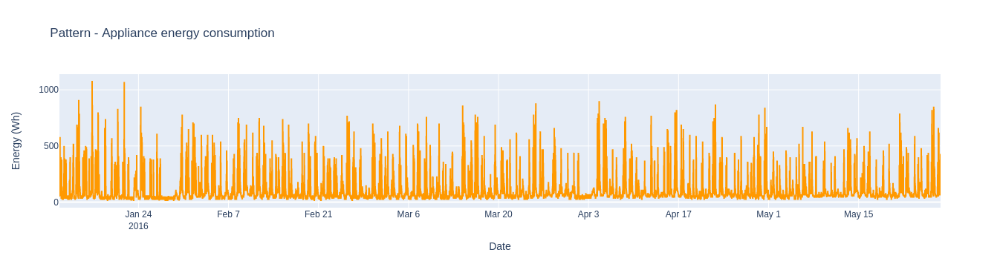

In [29]:
# plotly
import chart_studio.plotly as py
from plotly.offline import init_notebook_mode, iplot
# init_notebook_mode(connected=True)
import plotly.graph_objs as go

# To understand the timeseries variation of the applaince energy consumption
visData = go.Scatter(
    x = data.date,
    y = data.Appliances,
    mode = "lines",
    line_color="#ff9900"
)
layout = go.Layout(
    title = 'Pattern - Appliance energy consumption',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Energy (Wh)')
)
fig = go.Figure(data=[visData],layout=layout)

iplot(fig)

In [30]:
# Adding column to mark weekdays (0) and weekends(1) for time series evaluation , 
# decided not to use it for model evaluation as it has least impact

data['WEEKDAY'] = ((pd.to_datetime(data['date']).dt.dayofweek)// 5 == 1).astype(float)
# There are 5472 weekend recordings 
data['WEEKDAY'].value_counts()

0.0    14263
1.0     5472
Name: WEEKDAY, dtype: int64

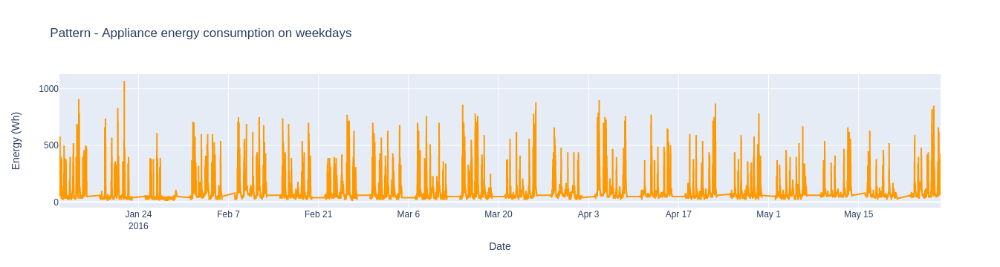

In [31]:
# Find rows with weekday 
temp_weekday =  data[data['WEEKDAY'] == 0]
# To understand the timeseries variation of the applaince energy consumption
visData = go.Scatter(
    x = temp_weekday.date,
    y = temp_weekday.Appliances,
    mode = "lines",
    line_color=asif_graph_color_theme
)
layout = go.Layout(
    title = 'Pattern - Appliance energy consumption on weekdays',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Energy (Wh)')
)
fig = go.Figure(data=[visData],layout=layout)

iplot(fig)

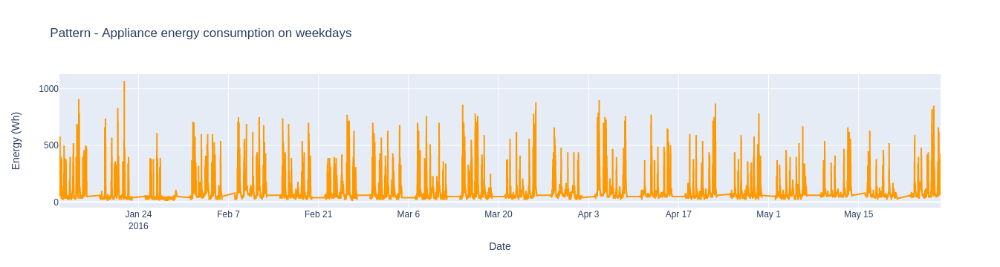

In [32]:
# Find rows with weekday 
temp_weekday =  data[data['WEEKDAY'] == 0]
# To understand the timeseries variation of the applaince energy consumption
visData = go.Scatter(
    x= temp_weekday.date,
    y = temp_weekday.Appliances,
    mode = "lines",
    line_color=asif_graph_color_theme
)
layout = go.Layout(
    title = 'Pattern - Appliance energy consumption on weekdays',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Energy (Wh)')
)
fig = go.Figure(data=[visData],layout=layout)

iplot(fig)

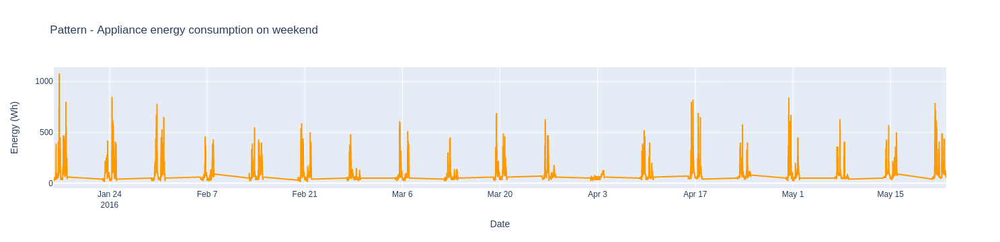

In [33]:
# Find rows with weekend 

temp_weekend =  data[data['WEEKDAY'] == 1]

# To understand the timeseries variation of the applaince energy consumption
visData = go.Scatter(
    x= temp_weekend.date,
    y = temp_weekend.Appliances,
    mode = "lines",
    line_color=asif_graph_color_theme
)
layout = go.Layout(
    title = 'Pattern - Appliance energy consumption on weekend',
    xaxis=dict(title='Date'),
    yaxis=dict(title='Energy (Wh)')
)
fig = go.Figure(data=[visData],layout=layout)

iplot(fig)

array([[<AxesSubplot: title={'center': 'T1'}>,
        <AxesSubplot: title={'center': 'T2'}>,
        <AxesSubplot: title={'center': 'T3'}>,
        <AxesSubplot: title={'center': 'T4'}>,
        <AxesSubplot: title={'center': 'T5'}>],
       [<AxesSubplot: title={'center': 'T6'}>,
        <AxesSubplot: title={'center': 'T7'}>,
        <AxesSubplot: title={'center': 'T8'}>,
        <AxesSubplot: title={'center': 'T9'}>,
        <AxesSubplot: title={'center': 'RH_1'}>],
       [<AxesSubplot: title={'center': 'RH_2'}>,
        <AxesSubplot: title={'center': 'RH_3'}>,
        <AxesSubplot: title={'center': 'RH_4'}>,
        <AxesSubplot: title={'center': 'RH_5'}>,
        <AxesSubplot: title={'center': 'RH_6'}>],
       [<AxesSubplot: title={'center': 'RH_7'}>,
        <AxesSubplot: title={'center': 'RH_8'}>,
        <AxesSubplot: title={'center': 'RH_9'}>,
        <AxesSubplot: title={'center': 'T_out'}>,
        <AxesSubplot: title={'center': 'Tdewpoint'}>],
       [<AxesSubplot: title=

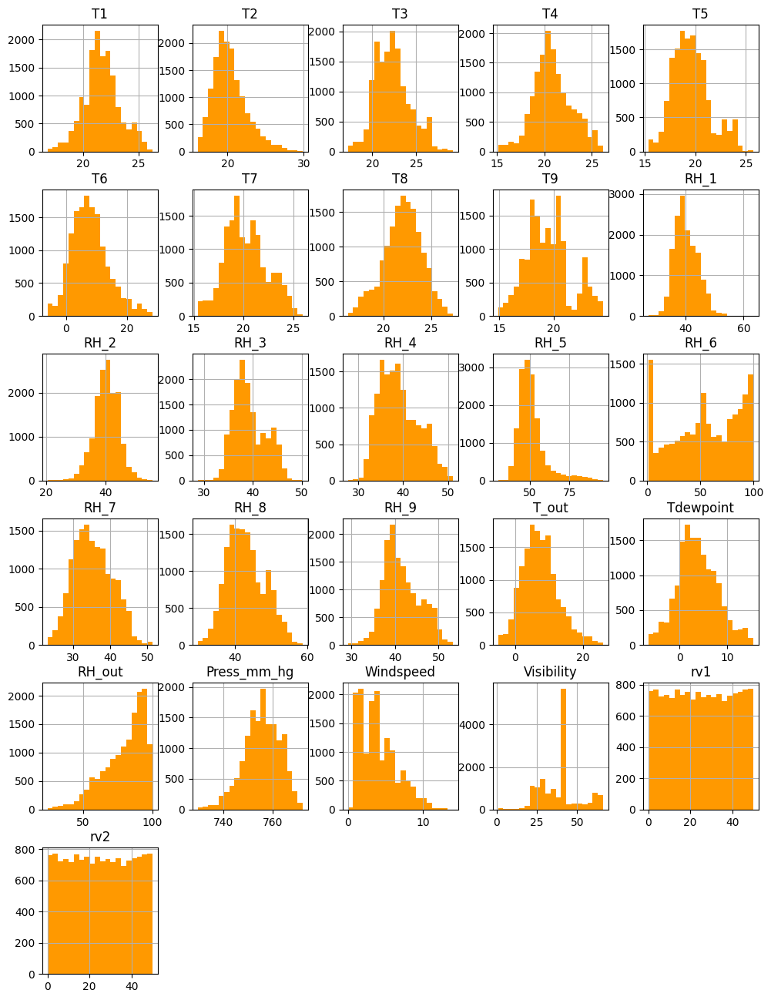

In [34]:
# Histogram of all the features to understand the distribution
feature_vars.hist(
    bins = 20,
    color = asif_graph_color_theme,
    figsize= (12,16)
)

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function

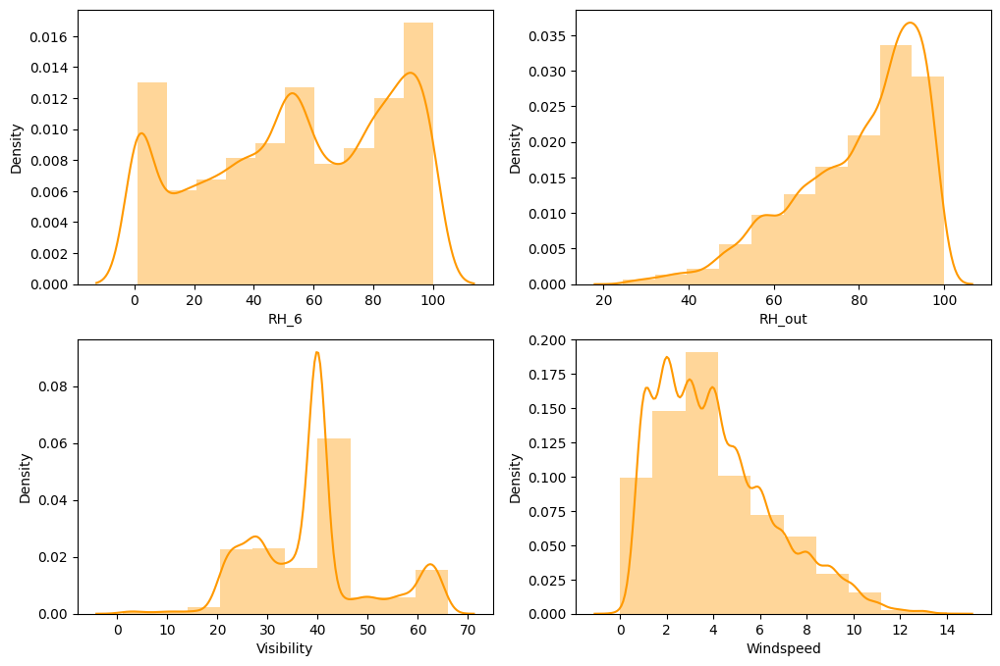

In [35]:
# focussed displots for RH_6 , RH_out , Visibility , Windspeed due to irregular distribution
f, ax = plt.subplots(2,2,figsize=(12,8))
vis1 = sns.distplot(feature_vars["RH_6"], bins=10, ax = ax[0][0], color = asif_graph_color_theme)
vis2 = sns.distplot(feature_vars["RH_out"],bins=10, ax =ax[0][1], color = asif_graph_color_theme)
vis3 = sns.distplot(feature_vars["Visibility"],bins=10, ax =ax[1][0], color = asif_graph_color_theme)
vis4 = sns.distplot(feature_vars["Windspeed"],bins=10, ax = ax[1][1], color = asif_graph_color_theme)

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot: xlabel='Appliance energy consumption in Wh', ylabel='Frequency'>

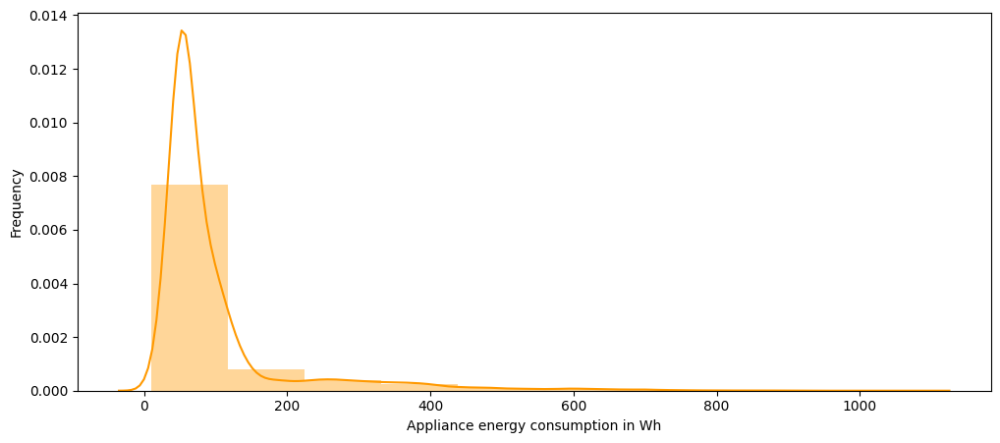

In [36]:
# Distribution of values in Applainces column
f = plt.figure(figsize=(12,5))
plt.xlabel('Appliance energy consumption in Wh')
plt.ylabel('Frequency')
sns.distplot(target_vars, bins=10, color = asif_graph_color_theme)

In [37]:
#Appliance column range with consumption less than 200 Wh
print('Percentage of the appliance consumption is less than 200 Wh')
print(((target_vars[target_vars <= 200].count()) / (len(target_vars)))*100 )

Percentage of the appliance consumption is less than 200 Wh
Appliances    90.250659
dtype: float64


/tmp/ipykernel_555524/1044718324.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



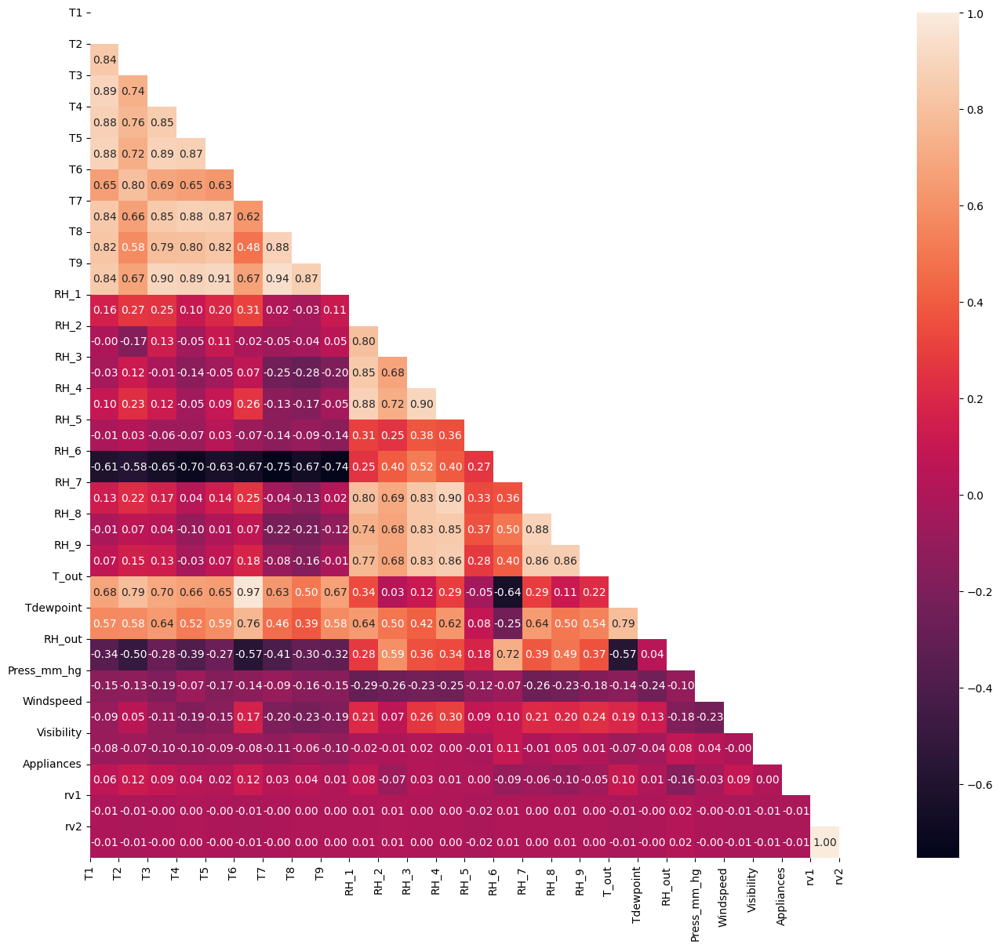

In [38]:
# Use the weather , temperature , applainces and random column to see the correlation
train_corr = train[col_temp + col_hum + col_weather +col_target+col_randoms]
corr = train_corr.corr()
# Mask the repeated values
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
  
f, ax = plt.subplots(figsize=(16, 14))
#Generate Heat Map, allow annotations and place floats in map
sns.heatmap(corr, annot=True, fmt=".2f" , mask=mask,)
    #Apply xticks
plt.xticks(range(len(corr.columns)), corr.columns);
    #Apply yticks
plt.yticks(range(len(corr.columns)), corr.columns)
    #show plot
plt.show()

In [39]:
def get_redundant_pairs(df):
    '''Get diagonal and lower triangular pairs of correlation matrix'''
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

# Function to get top correlations 

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]

print("Top Absolute Correlations")
print(get_top_abs_correlations(train_corr, 40))

Top Absolute Correlations
rv1   rv2      1.000000
T6    T_out    0.974683
T7    T9       0.943921
T5    T9       0.910009
T3    T9       0.900209
RH_3  RH_4     0.899889
RH_4  RH_7     0.895120
T1    T3       0.892292
T4    T9       0.888264
T3    T5       0.887545
RH_7  RH_8     0.884849
T1    T5       0.884692
T7    T8       0.881513
RH_1  RH_4     0.880504
T1    T4       0.876682
T4    T7       0.876677
      T5       0.871733
T5    T7       0.869655
T8    T9       0.868251
RH_7  RH_9     0.860155
RH_4  RH_9     0.858454
RH_8  RH_9     0.857476
T3    T4       0.851790
RH_4  RH_8     0.848829
T3    T7       0.846021
RH_1  RH_3     0.845592
T1    T9       0.842862
      T7       0.837079
      T2       0.835729
RH_3  RH_9     0.834419
      RH_7     0.833924
      RH_8     0.831060
T1    T8       0.824657
T5    T8       0.824057
T2    T6       0.801219
RH_1  RH_7     0.800827
      RH_2     0.797598
T4    T8       0.796458
T3    T8       0.794213
T2    T_out    0.791553
dtype: float64

In [40]:
#Split training dataset into independent and dependent varibales
train_X = train[feature_vars.columns]
train_y = train[target_vars.columns]
train_X.drop(['date'], axis=1, inplace=True)

/tmp/ipykernel_555524/1156324495.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [41]:
# time consuming cell # 1

### - Feature selection using Boruta Algorithm

In [42]:
#Boruta algorith for feature selection
from sklearn.ensemble import RandomForestRegressor
from boruta import BorutaPy
from datetime import datetime

X=train_X.values
y=train_y.values
y=y.ravel()

def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

rfc = RandomForestRegressor(n_estimators=100, max_depth=6, criterion='mse')
boruta_selector = BorutaPy(rfc, n_estimators='auto', verbose=2)
start_time = timer(None)
boruta_selector.fit(X, y)
timer(start_time)

/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	26
Rejected: 	0


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	8 / 100
Confirmed: 	16
Tentative: 	7
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	9 / 100
Confirmed: 	16
Tentative: 	7
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	10 / 100
Confirmed: 	16
Tentative: 	7
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	11 / 100
Confirmed: 	16
Tentative: 	7
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	12 / 100
Confirmed: 	18
Tentative: 	5
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	13 / 100
Confirmed: 	18
Tentative: 	5
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	14 / 100
Confirmed: 	18
Tentative: 	5
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	15 / 100
Confirmed: 	18
Tentative: 	5
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	16 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	17 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	18 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	19 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	20 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	21 / 100
Confirmed: 	20
Tentative: 	3
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	22 / 100
Confirmed: 	21
Tentative: 	2
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	23 / 100
Confirmed: 	21
Tentative: 	2
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	24 / 100
Confirmed: 	21
Tentative: 	2
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	25 / 100
Confirmed: 	21
Tentative: 	2
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	26 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	27 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	28 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	29 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	30 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	31 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	32 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	33 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	34 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	35 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	36 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	37 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	38 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	39 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	40 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	41 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	42 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	43 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	44 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	45 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	46 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	47 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	48 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	49 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	50 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	51 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	52 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	53 / 100
Confirmed: 	22
Tentative: 	1
Rejected: 	3


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:400: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



Iteration: 	54 / 100
Confirmed: 	23
Tentative: 	0
Rejected: 	3


BorutaPy finished running.

Iteration: 	55 / 100
Confirmed: 	23
Tentative: 	0
Rejected: 	3

 Time taken: 0 hours 12 minutes and 45.08 seconds.


In [43]:
timer(start_time)


 Time taken: 0 hours 12 minutes and 45.08 seconds.


In [44]:
boruta_selector.support_

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True, False, False, False])

In [45]:
boruta_selector.ranking_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 3, 4])

In [46]:
#Split testing dataset into independent and dependent varibales
test_X = test[feature_vars.columns]
test_y = test[target_vars.columns]

In [47]:
# Due to conlusion made above below columns are removed
train_X.drop(["rv1","rv2","Visibility","T6","T9"],axis=1 , inplace=True)

/tmp/ipykernel_555524/1730673102.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [48]:
# Due to conlusion made above below columns are removed
test_X.drop(["rv1","rv2","Visibility","T6","T9","date"], axis=1, inplace=True)

/tmp/ipykernel_555524/1293234125.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [49]:
train_X.columns

Index(['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T8', 'RH_1', 'RH_2', 'RH_3',
       'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'Tdewpoint',
       'RH_out', 'Press_mm_hg', 'Windspeed'],
      dtype='object')

In [50]:
test_X.columns

Index(['T1', 'T2', 'T3', 'T4', 'T5', 'T7', 'T8', 'RH_1', 'RH_2', 'RH_3',
       'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out', 'Tdewpoint',
       'RH_out', 'Press_mm_hg', 'Windspeed'],
      dtype='object')

In [51]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

# Create test and training set by including Appliances column

train = train[list(train_X.columns.values) + col_target ]

test = test[list(test_X.columns.values) + col_target ]

# Create dummy test and training set to hold scaled values

sc_train = pd.DataFrame(columns=train.columns , index=train.index)

sc_train[sc_train.columns] = sc.fit_transform(train)

sc_test= pd.DataFrame(columns=test.columns , index=test.index)

sc_test[sc_test.columns] = sc.fit_transform(test)

In [52]:
sc_train.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,...,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Appliances
9544,0.569827,-0.383584,-0.384018,0.996241,-0.229230,0.349500,0.441571,-1.398755,-0.629413,-1.197521,...,0.103642,-1.657784,-0.848083,-1.033732,-0.978251,-0.803979,0.529878,1.167725,-1.112160,-0.270443
19366,1.254979,0.298556,1.561061,1.344290,0.163277,1.299615,1.112907,0.004687,0.604569,0.228904,...,-0.471944,-0.060622,0.086994,0.725258,-0.217827,0.365687,0.931169,0.226014,-1.248270,-0.464759
10816,0.320681,0.054501,0.366012,-0.229283,0.145189,0.297243,0.822507,1.388043,1.101918,-0.212353,...,-0.676999,0.311400,0.163327,-0.049050,1.120770,0.803317,-0.896934,-0.733721,0.929492,0.021032
15457,-0.246127,-0.961129,-0.489022,-0.159019,-0.162305,-0.363087,0.087967,-1.125096,-0.629413,-1.367589,...,-0.110291,-1.110463,0.001120,-1.368892,-1.339609,-1.006881,0.975757,-0.046587,-0.839939,-0.561918
2956,-0.246127,-0.024324,-0.300681,-1.013618,-0.061616,-0.579502,-0.564579,1.789743,1.680118,2.300361,...,1.453771,3.043131,2.777725,2.719419,0.630579,1.400086,0.864287,0.419763,1.065602,-0.464759


In [53]:
sc_test.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,...,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Appliances
6314,-0.678526,-0.337714,-0.758967,-0.272083,-0.811540,-0.409392,-0.946375,-0.352449,-0.426736,0.306431,...,1.086122,-0.407472,-0.731388,-0.437093,-0.232839,-1.157146,-1.318014,0.377392,-0.809142,-0.367942
12257,0.814344,0.289201,1.432662,0.317741,1.062631,0.811654,1.049857,0.671740,1.084770,-0.220306,...,-1.056634,-0.276865,-0.989635,-0.554766,0.865496,0.485626,-0.967649,-0.401660,0.004891,3.087003
6271,-0.850621,-1.058130,-0.526796,-0.515812,-0.654758,-0.600348,-0.929458,-0.182731,0.160016,0.427270,...,0.869462,0.702690,0.538598,0.705174,-1.611203,-1.275901,1.191050,0.616061,-0.876978,-0.664080
18179,0.938750,0.485399,0.955147,1.146419,1.134714,1.502863,1.400044,-0.419664,-0.511502,-0.885589,...,-1.365905,-0.346975,-0.678579,-1.043214,0.591690,0.568755,-0.323430,0.701622,-1.216158,-0.565367
9661,0.005706,-0.368370,-0.396714,-0.137220,-0.595289,-0.270881,0.339334,-0.797748,-0.320955,-1.037265,...,0.039148,-1.025548,-1.028276,-1.198139,-0.307513,-0.001268,0.524227,0.917775,0.004891,0.224334


In [54]:
# Remove Appliances column from traininig set

train_X =  sc_train.drop(['Appliances'] , axis=1)
train_y = sc_train['Appliances']

test_X =  sc_test.drop(['Appliances'] , axis=1)
test_y = sc_test['Appliances']

In [55]:
train_X.head()

,T1,T2,T3,T4,T5,T7,T8,RH_1,RH_2,RH_3,...,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed
9544,0.569827,-0.383584,-0.384018,0.996241,-0.229230,0.349500,0.441571,-1.398755,-0.629413,-1.197521,...,2.267242,0.103642,-1.657784,-0.848083,-1.033732,-0.978251,-0.803979,0.529878,1.167725,-1.112160
19366,1.254979,0.298556,1.561061,1.344290,0.163277,1.299615,1.112907,0.004687,0.604569,0.228904,...,-1.454588,-0.471944,-0.060622,0.086994,0.725258,-0.217827,0.365687,0.931169,0.226014,-1.248270
10816,0.320681,0.054501,0.366012,-0.229283,0.145189,0.297243,0.822507,1.388043,1.101918,-0.212353,...,-0.101804,-0.676999,0.311400,0.163327,-0.049050,1.120770,0.803317,-0.896934,-0.733721,0.929492
15457,-0.246127,-0.961129,-0.489022,-0.159019,-0.162305,-0.363087,0.087967,-1.125096,-0.629413,-1.367589,...,1.009651,-0.110291,-1.110463,0.001120,-1.368892,-1.339609,-1.006881,0.975757,-0.046587,-0.839939
2956,-0.246127,-0.024324,-0.300681,-1.013618,-0.061616,-0.579502,-0.564579,1.789743,1.680118,2.300361,...,0.137914,1.453771,3.043131,2.777725,2.719419,0.630579,1.400086,0.864287,0.419763,1.065602


In [56]:
train_y.head()

9544    -0.270443
19366   -0.464759
10816    0.021032
15457   -0.561918
2956    -0.464759
Name: Appliances, dtype: float64

### - If you want to add more models, put here in the list and run the following commands to fit each model over the data.

In [57]:
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

models = [
           ['RandomForest ',RandomForestRegressor()],
           ['ExtraTreeRegressor :',ExtraTreesRegressor()]
]

In [58]:
# time consuming cell # 2

### - Iterate models, i.e., RandomForest and ExtraTreeRegressor for updating the model information

In [59]:
# Run all the proposed models and update the information in a list model_data
import time
from math import sqrt
from sklearn.metrics import mean_squared_error

model_data = []
for name,curr_model in models :
    curr_model_data = {}
    curr_model.random_state = 78
    curr_model_data["Name"] = name
    start = time.time()
    curr_model.fit(train_X,train_y)
    end = time.time()
    curr_model_data["Train_Time"] = end - start
    curr_model_data["Train_R2_Score"] = metrics.r2_score(train_y,curr_model.predict(train_X))
    curr_model_data["Test_R2_Score"] = metrics.r2_score(test_y,curr_model.predict(test_X))
    curr_model_data["Test_RMSE_Score"] = sqrt(mean_squared_error(test_y,curr_model.predict(test_X)))
    model_data.append(curr_model_data)

In [60]:
model_data

[{'Name': 'RandomForest ',
  'Train_Time': 17.750112056732178,
  'Train_R2_Score': 0.9393264177690678,
  'Test_R2_Score': 0.5557145977210723,
  'Test_RMSE_Score': 0.6665473743695399},
 {'Name': 'ExtraTreeRegressor :',
  'Train_Time': 4.541959285736084,
  'Train_R2_Score': 1.0,
  'Test_R2_Score': 0.632617176565367,
  'Test_RMSE_Score': 0.6061211293418446}]

In [61]:
df = pd.DataFrame(model_data)

In [62]:
print (
    "As the performance of ExtraTreeRegressor is better than the RandomForest, So we only proceed with the ExtraTreeRegressor"
)

As the performance of ExtraTreeRegressor is better than the RandomForest, So we only proceed with the ExtraTreeRegressor


<AxesSubplot: title={'center': 'Comparison of RandomForest and ExtraTreeRegressor Training Performance'}, xlabel='Name'>

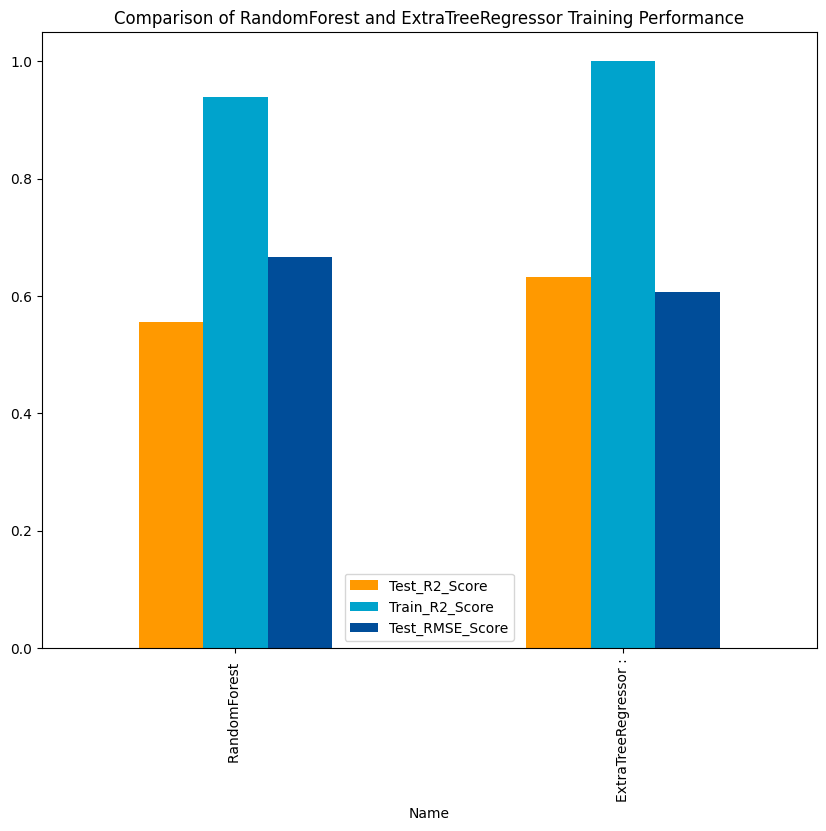

In [63]:
df.plot(
    x="Name",
    y=['Test_R2_Score', 'Train_R2_Score', 'Test_RMSE_Score'],
    kind="bar",
    color=asif_colors,
    title = 'Comparison of RandomForest and ExtraTreeRegressor Training Performance',
    figsize= (10,8)
)

In [64]:
# time consuming cell # 3

### - Tuning the parameter (ExtraTreeRegressor)

In [65]:
from sklearn.model_selection import GridSearchCV

param_grid = [{
    'max_depth': [80, 150, 200,250],
    'n_estimators' : [100,150,200,250],
    'max_features': ["auto", "sqrt", "log2"]
}]
reg = ExtraTreesRegressor(random_state=40)
# Instantiate the grid search model
grid_search = GridSearchCV(
    estimator = reg,
    param_grid = param_grid,
    cv = 5,
    n_jobs = -1,
    scoring='r2',
    verbose=2
)
grid_search.fit(train_X, train_y)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/home/xsif/anaconda3/envs/env005_energypredappliances/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A 

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(random_state=40), n_jobs=-1,
             param_grid=[{'max_depth': [80, 150, 200, 250],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'n_estimators': [100, 150, 200, 250]}],
             scoring='r2', verbose=2)

In [66]:
# Tuned parameter set
grid_search.best_params_

{'max_depth': 80, 'max_features': 'sqrt', 'n_estimators': 150}

In [67]:
# Best possible parameters for ExtraTreesRegressor
grid_search.best_estimator_

# R2 score on training set with tuned parameters

grid_search.best_estimator_.score(train_X,train_y)

1.0

In [68]:
# R2 score on test set with tuned parameters
grid_search.best_estimator_.score(test_X,test_y)

0.6320200276731016

In [69]:
# RMSE score on test set with tuned parameters

np.sqrt(mean_squared_error(test_y, grid_search.best_estimator_.predict(test_X)))

0.6066135279788099

In [70]:
# Get sorted list of features in order of importance
feature_indices = np.argsort(grid_search.best_estimator_.feature_importances_)

In [71]:
feature_indices

array([ 4,  0, 20,  5,  3, 17, 11, 15,  6, 10, 12, 16,  1, 13,  8, 19,  9,
        2, 18,  7, 14])

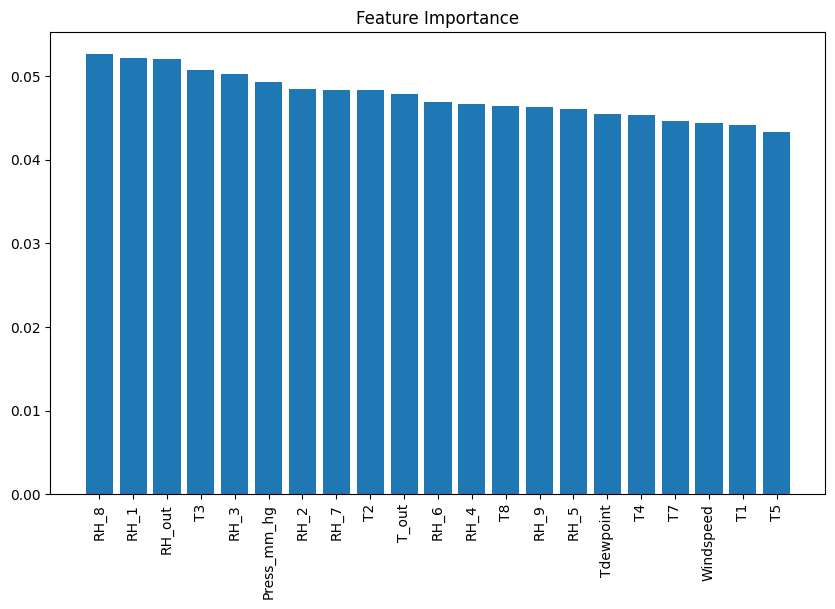

In [72]:
importances = grid_search.best_estimator_.feature_importances_
indices = np.argsort(importances)[::-1]
names = [train_X.columns[i] for i in indices]
# Create plot
plt.figure(figsize=(10,6))

# Create plot title
plt.title("Feature Importance")

# Add bars
plt.bar(range(train_X.shape[1]), importances[indices])

# Add feature names as x-axis labels
plt.xticks(range(train_X.shape[1]), names, rotation=90)

# Show plot
plt.show()

## LSTM

In [73]:
from math import sqrt
from sklearn.model_selection import train_test_split
from numpy import concatenate
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from pandas import to_datetime
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from matplotlib import pyplot

In [74]:
# convert series to supervised learning
def series_to_supervised(dataset, n_in=1, n_out=1, dropnan=True):
    num_vars = 1 if type(dataset) is list else dataset.shape[1]
    dataframe = DataFrame(dataset)
    cols, names = list(), list()
    
    # input sequence (t-n, ....t-1)
    for i in range(n_in, 0, -1):
        cols.append(dataframe.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(num_vars)]
    # forecast sequence (t, t+1 .... t+n)
    for i in range(0, n_out):
        cols.append(dataframe.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(num_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(num_vars)]
    
    # put it all together 
    agg = concat(cols, axis=1)
    agg.columns = names
    
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

In [75]:
feature=[
    "RH_out","RH_8","RH_1","T3","RH_3","T2","Press_mm_hg","RH_2","RH_7","T8",
    "RH_6","RH_4","RH_5","T_out","RH_9","T4","T7","Tdewpoint","Windspeed","T1","T5"
]
data1 = data[col_target + col_time + feature]

In [114]:
data1

,Appliances,RH_out,RH_8,RH_1,T3,RH_3,T2,Press_mm_hg,RH_2,RH_7,...,RH_4,RH_5,T_out,RH_9,T4,T7,Tdewpoint,Windspeed,T1,T5
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,92.000000,48.900000,47.596667,19.790000,44.730000,19.200000,733.5,44.790000,41.626667,...,45.566667,55.200000,6.600000,45.5300,19.000000,17.200000,5.300000,7.000000,19.890000,17.166667
2016-01-11 17:10:00,60,92.000000,48.863333,46.693333,19.790000,44.790000,19.200000,733.6,44.722500,41.560000,...,45.992500,55.200000,6.483333,45.5600,19.000000,17.200000,5.200000,6.666667,19.890000,17.166667
2016-01-11 17:20:00,50,92.000000,48.730000,46.300000,19.790000,44.933333,19.200000,733.7,44.626667,41.433333,...,45.890000,55.090000,6.366667,45.5000,18.926667,17.200000,5.100000,6.333333,19.890000,17.166667
2016-01-11 17:30:00,50,92.000000,48.590000,46.066667,19.790000,45.000000,19.200000,733.8,44.590000,41.290000,...,45.723333,55.090000,6.250000,45.4000,18.890000,17.133333,5.000000,6.000000,19.890000,17.166667
2016-01-11 17:40:00,60,92.000000,48.590000,46.333333,19.790000,45.000000,19.200000,733.9,44.530000,41.230000,...,45.530000,55.090000,6.133333,45.4000,18.890000,17.200000,4.900000,5.666667,19.890000,17.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-05-27 17:20:00,100,55.666667,50.074000,46.560000,27.200000,41.163333,25.890000,755.2,42.025714,44.500000,...,45.590000,52.400000,22.733333,46.7900,24.700000,24.500000,13.333333,3.333333,25.566667,23.200000
2016-05-27 17:30:00,90,56.000000,49.790000,46.500000,27.133333,41.223333,25.754000,755.2,42.080000,44.414286,...,45.590000,52.326667,22.600000,46.7900,24.700000,24.557143,13.300000,3.500000,25.500000,23.230000
2016-05-27 17:40:00,270,56.333333,49.660000,46.596667,27.050000,41.690000,25.628571,755.2,42.768571,44.400000,...,45.730000,52.266667,22.466667,46.7900,24.700000,24.540000,13.266667,3.666667,25.500000,23.230000


In [76]:
import pandas as pd

data1["date"]=pd.to_datetime(data1["date"])
data1 = data1.set_index(['date'], drop=True)
data1.head()

/tmp/ipykernel_555524/899795577.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Appliances,RH_out,RH_8,RH_1,T3,RH_3,T2,Press_mm_hg,RH_2,RH_7,...,RH_4,RH_5,T_out,RH_9,T4,T7,Tdewpoint,Windspeed,T1,T5
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 17:00:00,60,92.0,48.900000,47.596667,19.79,44.730000,19.2,733.5,44.790000,41.626667,...,45.566667,55.20,6.600000,45.53,19.000000,17.200000,5.3,7.000000,19.89,17.166667
2016-01-11 17:10:00,60,92.0,48.863333,46.693333,19.79,44.790000,19.2,733.6,44.722500,41.560000,...,45.992500,55.20,6.483333,45.56,19.000000,17.200000,5.2,6.666667,19.89,17.166667
2016-01-11 17:20:00,50,92.0,48.730000,46.300000,19.79,44.933333,19.2,733.7,44.626667,41.433333,...,45.890000,55.09,6.366667,45.50,18.926667,17.200000,5.1,6.333333,19.89,17.166667
2016-01-11 17:30:00,50,92.0,48.590000,46.066667,19.79,45.000000,19.2,733.8,44.590000,41.290000,...,45.723333,55.09,6.250000,45.40,18.890000,17.133333,5.0,6.000000,19.89,17.166667
2016-01-11 17:40:00,60,92.0,48.590000,46.333333,19.79,45.000000,19.2,733.9,44.530000,41.230000,...,45.530000,55.09,6.133333,45.40,18.890000,17.200000,4.9,5.666667,19.89,17.200000


In [191]:
data1.columns

Index(['Appliances', 'RH_out', 'RH_8', 'RH_1', 'T3', 'RH_3', 'T2',
       'Press_mm_hg', 'RH_2', 'RH_7', 'T8', 'RH_6', 'RH_4', 'RH_5', 'T_out',
       'RH_9', 'T4', 'T7', 'Tdewpoint', 'Windspeed', 'T1', 'T5'],
      dtype='object')

In [77]:
values=data1.values
values.shape

(19735, 22)

In [200]:
values

array([[0.04672897, 0.89473684, 0.66141193, ..., 0.5       , 0.32734952,
        0.17550565],
       [0.04672897, 0.89473684, 0.66015536, ..., 0.47619048, 0.32734952,
        0.17550565],
       [0.03738318, 0.89473684, 0.65558602, ..., 0.45238095, 0.32734952,
        0.17550565],
       ...,
       [0.07476636, 0.42105263, 0.69191227, ..., 0.25      , 0.91974657,
        0.75489728],
       [0.24299065, 0.4254386 , 0.68745716, ..., 0.26190476, 0.91974657,
        0.75489728],
       [0.38317757, 0.42982456, 0.68261652, ..., 0.27380952, 0.91974657,
        0.75203058]])

In [78]:
# normalize features
scaler = MinMaxScaler(feature_range=(0,1))
scaled = scaler.fit_transform(values)

In [115]:
scaler

MinMaxScaler()

In [116]:
scaled

array([[0.04672897, 0.89473684, 0.66141193, ..., 0.5       , 0.32734952,
        0.17550565],
       [0.04672897, 0.89473684, 0.66015536, ..., 0.47619048, 0.32734952,
        0.17550565],
       [0.03738318, 0.89473684, 0.65558602, ..., 0.45238095, 0.32734952,
        0.17550565],
       ...,
       [0.24299065, 0.4254386 , 0.68745716, ..., 0.26190476, 0.91974657,
        0.75489728],
       [0.38317757, 0.42982456, 0.68261652, ..., 0.27380952, 0.91974657,
        0.75203058],
       [0.39252336, 0.43421053, 0.69006169, ..., 0.28571429, 0.91974657,
        0.75203058]])

In [79]:
reframed = series_to_supervised(scaled, 1, 1)

In [126]:
reframed.head()

,var1(t-1),var2(t-1),var3(t-1),var4(t-1),var5(t-1),var6(t-1),var7(t-1),var8(t-1),var9(t-1),var10(t-1),...,var13(t-1),var14(t-1),var15(t-1),var16(t-1),var17(t-1),var18(t-1),var19(t-1),var20(t-1),var21(t-1),var22(t-1)
1,0.046729,0.894737,0.661412,0.566187,0.215188,0.746066,0.225345,0.097674,0.684038,0.653428,...,0.764262,0.381691,0.372990,0.677290,0.351351,0.170594,0.538462,0.500000,0.32735,0.175506
2,0.046729,0.894737,0.660155,0.541326,0.215188,0.748871,0.225345,0.100000,0.682140,0.651064,...,0.782437,0.381691,0.369239,0.678532,0.351351,0.170594,0.533937,0.476190,0.32735,0.175506
3,0.037383,0.894737,0.655586,0.530502,0.215188,0.755569,0.225345,0.102326,0.679445,0.646572,...,0.778062,0.380037,0.365488,0.676049,0.344745,0.170594,0.529412,0.452381,0.32735,0.175506
4,0.037383,0.894737,0.650788,0.524080,0.215188,0.758685,0.225345,0.104651,0.678414,0.641489,...,0.770949,0.380037,0.361736,0.671909,0.341441,0.164310,0.524887,0.428571,0.32735,0.175506
5,0.046729,0.894737,0.650788,0.531419,0.215188,0.758685,0.225345,0.106977,0.676727,0.639362,...,0.762697,0.380037,0.357985,0.671909,0.341441,0.170594,0.520362,0.404762,0.32735,0.178691


In [165]:
type(reframed)

pandas.core.frame.DataFrame

In [81]:
reframed.drop(reframed.columns[[22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43]], axis=1, inplace=True)

In [82]:
values = reframed.values

In [83]:
X = values[:,:21]
Y = values[:,21]

In [84]:
X.shape

(19734, 21)

In [164]:
Y.shape

(19734,)

In [86]:
X_Train, X_Test, Y_Train, Y_Test = train_test_split(X, Y, test_size=0.3)

# reshape input to be 3D [samples, timesteps, features]
X_Train = X_Train.reshape((X_Train.shape[0], 1, X_Train.shape[1]))
X_Test = X_Test.reshape((X_Test.shape[0], 1, X_Test.shape[1]))

In [185]:
X_Train.shape

(13813, 1, 21)

In [186]:
Y_Train.shape

(13813,)

In [187]:
X_Test.shape

(5921, 21)

In [188]:
Y_Test.shape

(5921, 1)

In [87]:
# time consuming cell # 4

### - Configuring the LSTM model

In [ ]:
LSTM(
    50,
)

In [135]:
X_Train.shape

(13813, 1, 21)

In [88]:
# network architecture
model = Sequential()
model.add(LSTM(
    50, #units
    input_shape=(
        X_Train.shape[1],
        X_Train.shape[2]
    )
))
model.add(Dense(1))
model.compile(loss='mse', optimizer='adam')

# fit
history = model.fit(
    X_Train,
    Y_Train,
    epochs=70,
    batch_size=10,
    validation_data=(X_Test, Y_Test),
    verbose=2,
    shuffle=False
)

# model = Sequential()
# model.add(LSTM(hidden_size, input_shape=(maxlen, len(chars))))
# # Add the output layer that is a softmax of the number of characters
# model.add(Dense(len(chars), activation='softmax'))
# # Optimization through RMSprop
# optimizer_new = RMSprop()
# # Consider cross Entropy loss. Why? MLE of P(D | theta)
# model.compile(loss='categorical_crossentropy', optimizer=optimizer_new)

# # Train this for 30 epochs. Size of output from LSTM i.e. hidden layer vector shape=128
# model.fit(
#     x,
#     y,
#     epochs=30,
#     batch_size=128,
#     callbacks=[print_callback, checkpointer]
# )

2022-10-25 19:54:11.663483: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-25 19:54:11.668519: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Epoch 1/70
1382/1382 - 3s - loss: 0.0056 - val_loss: 0.0037 - 3s/epoch - 2ms/step
Epoch 2/70
1382/1382 - 2s - loss: 0.0036 - val_loss: 0.0034 - 2s/epoch - 2ms/step
Epoch 3/70
1382/1382 - 2s - loss: 0.0034 - val_loss: 0.0032 - 2s/epoch - 1ms/step
Epoch 4/70
1382/1382 - 2s - loss: 0.0033 - val_loss: 0.0031 - 2s/epoch - 1ms/step
Epoch 5/70
1382/1382 - 2s - loss: 0.0031 - val_loss: 0.0029 - 2s/epoch - 1ms/step
Epoch 6/70
1382/1382 - 2s - loss: 0.0029 - val_loss: 0.0027 - 2s/epoch - 1ms/step
Epoch 7/70
1382/1382 - 2s - loss: 0.0027 - val_loss: 0.0026 - 2s/epoch - 1ms/step
Epoch 8/70
1382/1382 - 2s - loss: 0.0026 - val_loss: 0.0025 - 2s/epoch - 1ms/step
Epoch 9/70
1382/1382 - 2s - loss: 0.0026 - val_loss: 0.0024 - 2s/epoch - 1ms/step
Epoch 10/70
1382/1382 - 2s - loss: 0.0025 - val_loss: 0.0024 - 2s/epoch - 1ms/step
Epoch 11/70
1382/1382 - 2s - loss: 0.0025 - val_loss: 0.0023 - 2s/epoch - 1ms/step
Epoch 12/70
1382/1382 - 2s - loss: 0.0024 - val_loss: 0.0023 - 2s/epoch - 1ms/step
Epoch 13/70
1

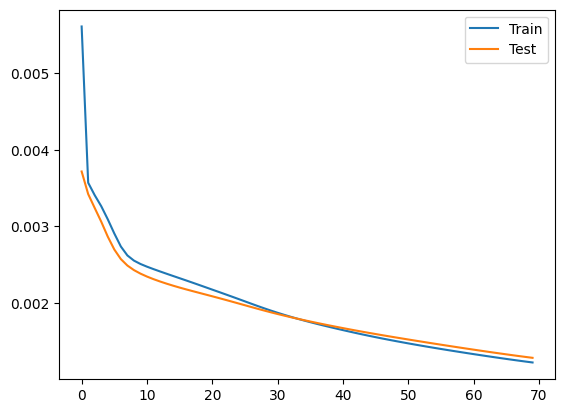

In [89]:
pyplot.plot(history.history['loss'], label='Train')
pyplot.plot(history.history['val_loss'], label='Test')
pyplot.legend()
pyplot.show()

In [90]:
sca=DataFrame(scaled)
sca.head()

,0,1,2,3,4,5,6,7,8,9,...,12,13,14,15,16,17,18,19,20,21
0,0.046729,0.894737,0.661412,0.566187,0.215188,0.746066,0.225345,0.097674,0.684038,0.653428,...,0.764262,0.381691,0.372990,0.677290,0.351351,0.170594,0.538462,0.500000,0.32735,0.175506
1,0.046729,0.894737,0.660155,0.541326,0.215188,0.748871,0.225345,0.100000,0.682140,0.651064,...,0.782437,0.381691,0.369239,0.678532,0.351351,0.170594,0.533937,0.476190,0.32735,0.175506
2,0.037383,0.894737,0.655586,0.530502,0.215188,0.755569,0.225345,0.102326,0.679445,0.646572,...,0.778062,0.380037,0.365488,0.676049,0.344745,0.170594,0.529412,0.452381,0.32735,0.175506
3,0.037383,0.894737,0.650788,0.524080,0.215188,0.758685,0.225345,0.104651,0.678414,0.641489,...,0.770949,0.380037,0.361736,0.671909,0.341441,0.164310,0.524887,0.428571,0.32735,0.175506
4,0.046729,0.894737,0.650788,0.531419,0.215188,0.758685,0.225345,0.106977,0.676727,0.639362,...,0.762697,0.380037,0.357985,0.671909,0.341441,0.170594,0.520362,0.404762,0.32735,0.178691


In [91]:
# time consuming cell # 5

In [92]:
lstm_test_mse = model.evaluate(X_Test, Y_Test, batch_size=1)
print('Test MSE: %f'%lstm_test_mse)

5921/5921 [==============================] - 10s 2ms/step - loss: 0.0013
Test MSE: 0.001288


In [93]:
from sklearn.metrics import r2_score

y_pred_test_lstm = model.predict(X_Test)
y_train_pred_lstm = model.predict(X_Train)
print("The R2 score on the Train set is:\t{:0.3f}".format(r2_score(Y_Train, y_train_pred_lstm)))
print("The R2 score on the Test set is:\t{:0.3f}".format(r2_score(Y_Test, y_pred_test_lstm)))

432/432 [==============================] - 1s 2ms/step
The R2 score on the Train set is:	0.961
The R2 score on the Test set is:	0.958


186/186 [==============================] - 0s 2ms/step


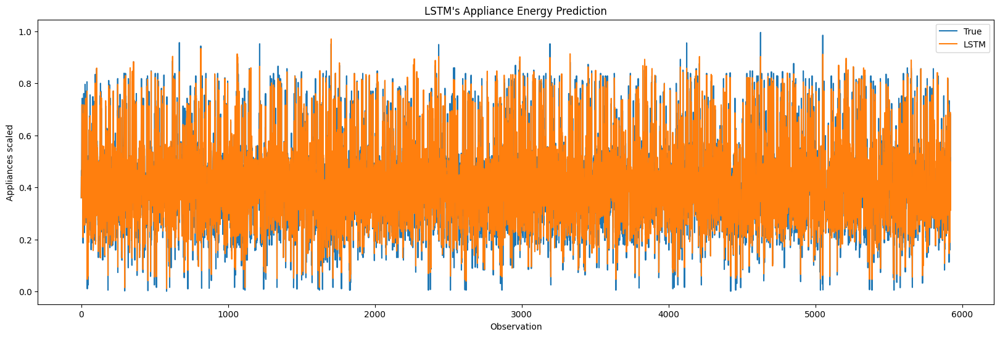

In [94]:
lstm_y_pred_test = model.predict(X_Test)
plt.figure(figsize=(20, 6))
plt.plot(Y_Test, label='True')
plt.plot(y_pred_test_lstm, label='LSTM')
plt.title("LSTM's Appliance Energy Prediction")
plt.xlabel('Observation')
plt.ylabel('Appliances scaled')
plt.legend()
plt.show();

In [95]:
# make a prediction
yhat = model.predict(X_Test)
X_Test = X_Test.reshape((X_Test.shape[0], 21))
# invert scaling for forecast
inv_yhat = np.concatenate((yhat, X_Test[:, -21:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
Y_Test = Y_Test.reshape((len(Y_Test), 1))
inv_y = np.concatenate((Y_Test, X_Test[:, -21:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

186/186 [==============================] - 0s 2ms/step
Test RMSE: 38.407


### TRAIN 
- MSE 0.001576
- R2 SCORE 0.953

### TEST 
- RMSE 42.483
- R2 SCORE 0.947

## ARIMA

In [96]:
# Import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy import stats
import statsmodels.api as sm
import warnings
from itertools import product
from datetime import datetime
warnings.filterwarnings('ignore')
plt.style.use('seaborn-poster')

In [97]:
# df = pd.read_csv("../input/KAG_energydata_complete.csv")
df = pd.read_csv("../datasets/01_KAG_energydata_complete/KAG_energydata_complete.csv")

In [98]:
data=df[['date','Appliances']]
data.head()

,date,Appliances
0,2016-01-11 17:00:00,60
1,2016-01-11 17:10:00,60
2,2016-01-11 17:20:00,50
3,2016-01-11 17:30:00,50
4,2016-01-11 17:40:00,60


In [99]:
# Unix-time to 
df.Timestamp = pd.to_datetime(df.date)

# Resampling to daily frequency
df.index = df.Timestamp
df = df.resample('D').mean()

# Resampling to monthly frequency
df_month = df.resample('M').mean()
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11,136.666667,30.000000,20.808571,46.906210,20.153333,44.793175,20.140972,45.992440,19.492222,47.260813,...,16.918175,45.106210,5.922619,735.173810,89.285714,6.083333,40.845238,4.228571,26.248800,26.248800
2016-01-12,85.694444,4.236111,20.092326,45.142014,19.307655,43.779733,19.993646,44.933171,19.772778,44.556840,...,17.032847,45.680127,5.566319,742.628125,87.500000,5.784722,37.229167,3.596528,25.505072,25.505072
2016-01-13,97.013889,5.416667,19.197824,42.867772,18.568513,42.119669,19.609213,43.720891,19.009803,42.315174,...,16.953576,44.691476,4.856944,754.790625,83.406250,5.614583,31.559028,2.169792,23.464726,23.464726
2016-01-14,151.388889,5.000000,20.372078,42.435191,19.743131,40.699172,20.837581,43.399740,18.694271,43.231053,...,16.884815,45.428229,3.431944,749.767361,86.420139,6.277778,35.149306,1.316667,25.264569,25.264569
2016-01-15,125.347222,5.972222,22.280949,39.099294,21.528172,38.193897,20.959074,41.409884,19.615127,41.961036,...,17.345694,44.534329,2.665278,754.579861,88.385417,7.770833,40.208333,0.849653,26.289515,26.289515


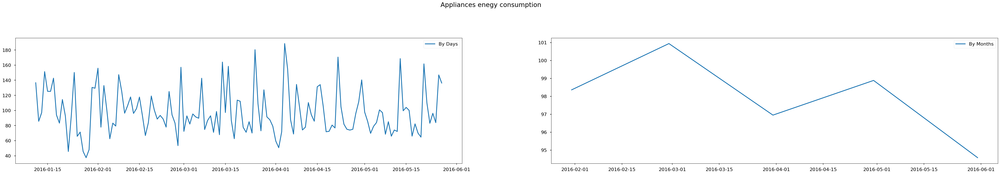

In [100]:
fig = plt.figure(figsize=[60, 17])
plt.suptitle('Appliances enegy consumption', fontsize=22)

plt.subplot(221)
plt.plot(df.Appliances, '-', label='By Days')
plt.legend()

plt.subplot(222)
plt.plot(df_month.Appliances, '-', label='By Months')
plt.legend()

In [101]:
print("Dickey–Fuller test: p=%f" % sm.tsa.stattools.adfuller(df.Appliances)[1])

Dickey–Fuller test: p=0.000000


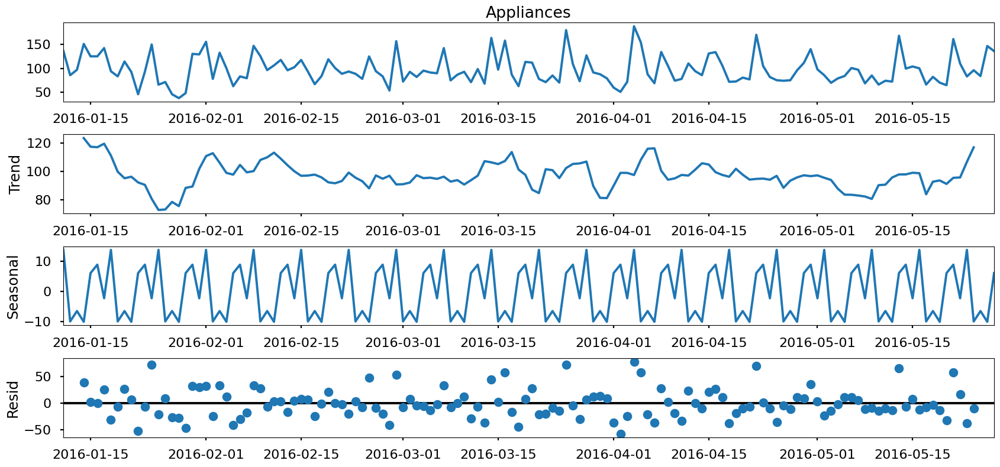

In [102]:
from pylab import rcParams
rcParams['figure.figsize'] = 17, 8

decomposition = sm.tsa.seasonal_decompose(df.Appliances, model='additive')
fig = decomposition.plot()
plt.show()

In [103]:
import itertools
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [104]:
mod = sm.tsa.statespace.SARIMAX(
    df.Appliances,
    order=(0, 1, 1),
    seasonal_order=(1, 0, 0, 12),
    enforce_stationarity=False,
    enforce_invertibility=False
)

results = mod.fit()

print(results.summary().tables[1])

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.49575D+00    |proj g|=  1.97040D-01

At iterate    5    f=  4.40643D+00    |proj g|=  1.75900D-02

At iterate   10    f=  4.38824D+00    |proj g|=  1.71364D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     14     24      1     0     0   2.449D-06   4.387D+00
  F =   4.3869479108747873     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                 coef    std err          z      P>|z|      [0.025    

 This problem is unconstrained.


In [112]:
pred = results.get_prediction(start=pd.to_datetime('2016-04-20'), dynamic=False)
pred_ci = pred.conf_int()

ax = df.Appliances['2016':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='forecast', alpha=.7, figsize=(14, 7))

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Appliances consumption')
plt.legend()

plt.show()

TypeError: cannot do slice indexing on RangeIndex with these indexers [2016] of type str

[CV] END ..max_depth=80, max_features=auto, n_estimators=100; total time=   6.0s
[CV] END ..max_depth=80, max_features=auto, n_estimators=200; total time=  12.0s
[CV] END ..max_depth=80, max_features=sqrt, n_estimators=200; total time=   4.3s
[CV] END ..max_depth=80, max_features=log2, n_estimators=100; total time=   2.8s
[CV] END ..max_depth=80, max_features=log2, n_estimators=150; total time=   4.0s
[CV] END ..max_depth=80, max_features=log2, n_estimators=250; total time=   5.7s
[CV] END .max_depth=150, max_features=auto, n_estimators=150; total time=  10.4s
[CV] END .max_depth=150, max_features=sqrt, n_estimators=100; total time=   2.2s
[CV] END .max_depth=150, max_features=sqrt, n_estimators=100; total time=   2.2s
[CV] END .max_depth=150, max_features=sqrt, n_estimators=150; total time=   3.2s
[CV] END .max_depth=150, max_features=sqrt, n_estimators=200; total time=   4.2s
[CV] END .max_depth=150, max_features=log2, n_estimators=100; total time=   2.1s
[CV] END .max_depth=150, max

In [106]:
y_forecasted = pred.predicted_mean
y_truth = df.Appliances['2016-04-20':]

mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

The Mean Squared Error of our forecasts is 803.0


In [107]:
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

The Root Mean Squared Error of our forecasts is 28.34


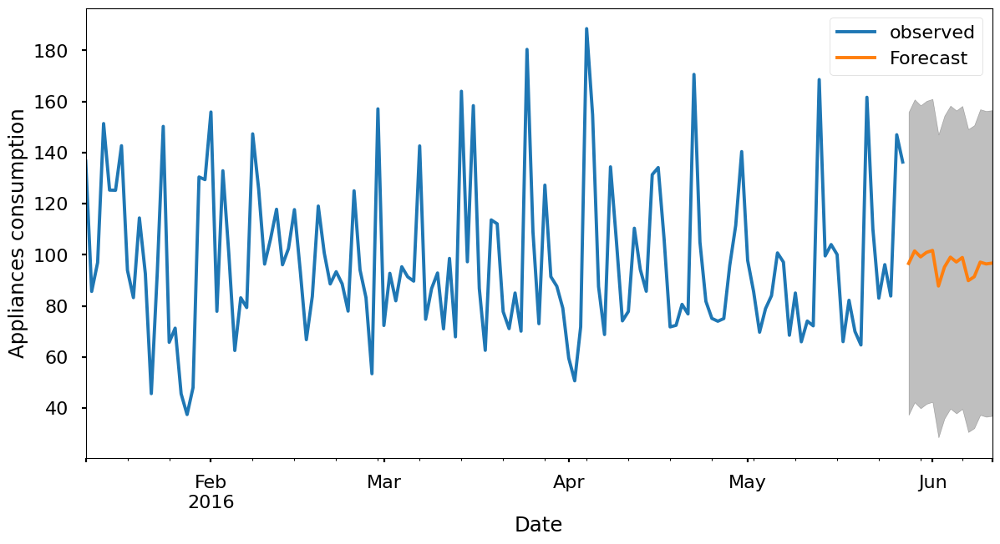

In [108]:
pred_uc = results.get_forecast(steps=15)
pred_ci = pred_uc.conf_int()

ax = df.Appliances.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Appliances consumption')

plt.legend()
plt.show()

# Run below given commands in a separate environment than the environment required for above commands, i.e., older python versions. Also manage the above provided/extracted/processed data to csvs/any-files so that below commands are not dependent on above provided/extracted/processed data

## For running the FBPROPHET, see the other notebook with the same name postfixed by py27

## FBPROPHET

In [109]:
import pandas as pd
from prophet import Prophet

In [110]:
# import pandas as pd
# from prophet import Prophet

# df=pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/master/examples/example_wp_log_peyton_manning.csv')
# df.head()

# m = Prophet()

# m.fit(df)

# forecast = m.predict(future)

# forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

# fig1 = m.plot(forecast)

19:56:29 - cmdstanpy - INFO - Chain [1] start processing
19:56:32 - cmdstanpy - INFO - Chain [1] done processing


KeyError: 'yhat'

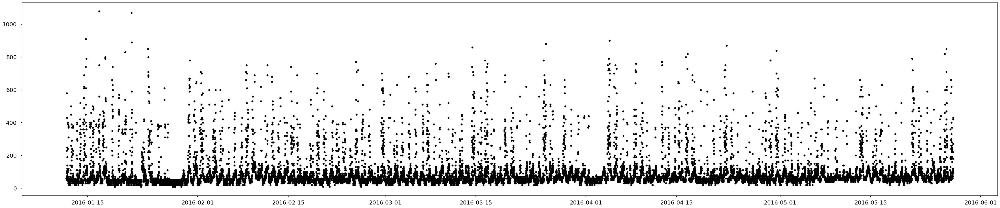

In [111]:
# Have to update these commands to run successfully

df = pd.read_csv("../datasets/01_KAG_energydata_complete/KAG_energydata_complete.csv")
data=df[['date','Appliances']]

data = data.rename(columns={'date': 'ds', 'Appliances': 'y'})

model = Prophet(interval_width=0.95)
model.fit(data)

future = model.make_future_dataframe(periods=10, freq='H')
forecast = model.predict(future)

# plt.figure(figsize=(30, 6))
model.plot(future, xlabel = 'Date', ylabel = 'comsumption', figsize=(50, 10))
plt.title('Appliances consumption');